### Используем модель Mediapipe для обнаружения рук на кадрах видео https://google.github.io/mediapipe/solutions/hands.html

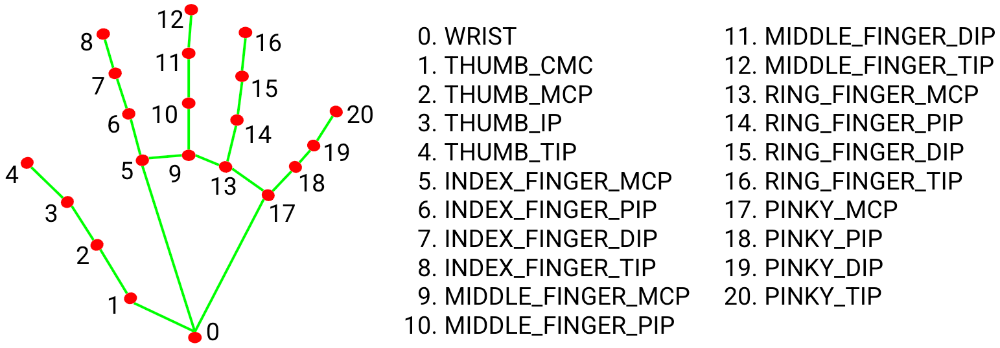

In [159]:
import cv2
import mediapipe as mp

from IPython.display import display, Image

import pandas as pd
import numpy as np
import math
from google.protobuf.json_format import MessageToDict

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

#### Пример работы модели Mediapipe

In [384]:
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles
mp_hands = mp.solutions.hands

# For webcam input:
#cap = cv2.VideoCapture(0)
cap = cv2.VideoCapture('/Users/vladislav/Documents/JupyterNotebook/ObjectDetection/Maintenance Hand Segmentation/Python Segmentation/pump_dataset/pump_videos/test_pump_video.mp4')
display_handle=display(None, display_id=True)

with mp_hands.Hands(
    model_complexity=0,
    min_detection_confidence=0.5,
    min_tracking_confidence=0.5) as hands:
    try:
        while cap.isOpened():
            lmList=[]
            success, image = cap.read()
            if not success:
                print("Ignoring empty camera frame.")
                # If loading a video, use 'break' instead of 'continue'.
                break
            
            # To improve performance, optionally mark the image as not writeable to
            # pass by reference.
            image.flags.writeable = False
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            results = hands.process(image)
        
            # Draw the hand annotations on the image.
            image.flags.writeable = True
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
            if results.multi_hand_landmarks:
                num_hands_detected = len(results.multi_hand_landmarks)
                
                for hand_landmarks in results.multi_hand_landmarks:
                    mp_drawing.draw_landmarks(
                        image,
                        hand_landmarks,
                        mp_hands.HAND_CONNECTIONS,
                        mp_drawing_styles.get_default_hand_landmarks_style(),
                        mp_drawing_styles.get_default_hand_connections_style())
                    #print(results.multi_hand_landmarks)
                    #print(results.multi_hand_world_landmarks)
                    #print(results.multi_handedness) #Left/Right and score
                    
                    # Display in notebook    
                    _, frame = cv2.imencode('.jpeg', image)
                    display_handle.update(Image(data=frame.tobytes()))
    except KeyboardInterrupt:
        pass
    finally:
        cap.release()
        display_handle.update(None)

None

#### Заполняем таблицу с координатами точек

In [385]:
mp_drawing = mp.solutions.drawing_utils
mp_drawing_styles = mp.solutions.drawing_styles
mp_hands = mp.solutions.hands

df = pd.DataFrame(columns=['Time,sec',
                           'Frame',
                           'Num Hands in frame',
                           'Left Hand label',
                           'Left Hand index',
                           'Right Hand label',
                           'Right Hand index',
                           'Left_RING_FINGER_TIP_X','Left_RING_FINGER_TIP_Y','Left_RING_FINGER_DIP_X','Left_RING_FINGER_DIP_Y','Left_RING_FINGER_PIP_X','Left_RING_FINGER_PIP_Y','Left_RING_FINGER_MCP_X','Left_RING_FINGER_MCP_Y',
                           'Left_MIDDLE_FINGER_TIP_X','Left_MIDDLE_FINGER_TIP_Y','Left_MIDDLE_FINGER_DIP_X','Left_MIDDLE_FINGER_DIP_Y','Left_MIDDLE_FINGER_PIP_X','Left_MIDDLE_FINGER_PIP_Y','Left_MIDDLE_FINGER_MCP_X','Left_MIDDLE_FINGER_MCP_Y',
                           'Left_PINKY_TIP_X','Left_PINKY_TIP_Y','Left_PINKY_DIP_X','Left_PINKY_DIP_Y','Left_PINKY_PIP_X','Left_PINKY_PIP_Y','Left_PINKY_MCP_X','Left_PINKY_MCP_Y',
                           'Left_INDEX_FINGER_TIP_X','Left_INDEX_FINGER_TIP_Y','Left_INDEX_FINGER_DIP_X','Left_INDEX_FINGER_DIP_Y','Left_INDEX_FINGER_PIP_X','Left_INDEX_FINGER_PIP_Y','Left_INDEX_FINGER_MCP_X','Left_INDEX_FINGER_MCP_Y',
                           'Left_THUMB_TIP_X','Left_THUMB_TIP_Y','Left_THUMB_IP_X','Left_THUMB_IP_Y','Left_THUMB_MCP_X','Left_THUMB_MCP_Y','Left_THUMB_CMC_X','Left_THUMB_CMC_Y',
                           'Left_WRIST_X', 'Left_WRIST_Y',
                           'Right_RING_FINGER_TIP_X','Right_RING_FINGER_TIP_Y','Right_RING_FINGER_DIP_X','Right_RING_FINGER_DIP_Y','Right_RING_FINGER_PIP_X','Right_RING_FINGER_PIP_Y','Right_RING_FINGER_MCP_X','Right_RING_FINGER_MCP_Y',
                           'Right_MIDDLE_FINGER_TIP_X','Right_MIDDLE_FINGER_TIP_Y','Right_MIDDLE_FINGER_DIP_X','Right_MIDDLE_FINGER_DIP_Y','Right_MIDDLE_FINGER_PIP_X','Right_MIDDLE_FINGER_PIP_Y','Right_MIDDLE_FINGER_MCP_X','Right_MIDDLE_FINGER_MCP_Y',
                           'Right_PINKY_TIP_X','Right_PINKY_TIP_Y','Right_PINKY_DIP_X','Right_PINKY_DIP_Y','Right_PINKY_PIP_X','Right_PINKY_PIP_Y','Right_PINKY_MCP_X','Right_PINKY_MCP_Y',
                           'Right_INDEX_FINGER_TIP_X','Right_INDEX_FINGER_TIP_Y','Right_INDEX_FINGER_DIP_X','Right_INDEX_FINGER_DIP_Y','Right_INDEX_FINGER_PIP_X','Right_INDEX_FINGER_PIP_Y','Right_INDEX_FINGER_MCP_X','Right_INDEX_FINGER_MCP_Y',
                           'Right_THUMB_TIP_X','Right_THUMB_TIP_Y','Right_THUMB_IP_X','Right_THUMB_IP_Y','Right_THUMB_MCP_X','Right_THUMB_MCP_Y','Right_THUMB_CMC_X','Right_THUMB_CMC_Y',
                           'Right_WRIST_X', 'Right_WRIST_Y',
                           'Xmax', 'Xmin', 'Ymax', 'Ymin'
                          ])
# For webcam input:
#cap = cv2.VideoCapture(0)
cap = cv2.VideoCapture('/Users/vladislav/Documents/JupyterNotebook/ObjectDetection/Maintenance Hand Segmentation/Python Segmentation/pump_dataset/pump_videos/test_pump_video.mp4')
# get cap property 
cap_width  = cap.get(cv2.CAP_PROP_FRAME_WIDTH)   # float `width`
cap_height = cap.get(cv2.CAP_PROP_FRAME_HEIGHT)  # float `height`

fps = int(cap.get(5))
print("Частота кадров: ", fps, "кадров в секунду")  
# Получить количество кадров
frame_count = cap.get(7)
print("Количество кадров: ", frame_count)
#duration = frame_count/fps
#print('duration (S) = ' + str(duration))
#minutes = int(duration/60)
#seconds = duration%60
#print('duration (M:S) = ' + str(minutes) + ':' + str(seconds))
duration = 0
# Счетчик кадров
frame_index = 0

display_handle=display(None, display_id=True)

with mp_hands.Hands(
    model_complexity=0,
    min_detection_confidence=0.5,
    min_tracking_confidence=0.5) as hands:
    try:
        while cap.isOpened():
            data = {}
            lmList=[]
            success, image = cap.read()
            if not success:
                print("Ignoring empty camera frame.")
                # If loading a video, use 'break' instead of 'continue'.
                break

            # Вычисляем номер кадра
            frame_index += 1
            data.update({'Frame': frame_index})

            # Считаем секунды в видео
            if frame_index%fps == 0:
                duration += 1
            data.update({'Time,sec': duration})

            # To improve performance, optionally mark the image as not writeable to
            # pass by reference.
            image.flags.writeable = False
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            results = hands.process(image)

            # Draw the hand annotations on the image.
            image.flags.writeable = True
            image = cv2.cvtColor(image, cv2.COLOR_RGB2BGR)
            if results.multi_hand_landmarks:
                num_hands_detected = len(results.multi_hand_landmarks)
                data.update({'Num Hands in frame': num_hands_detected})
                for hand_landmarks in results.multi_hand_landmarks:
                    mp_drawing.draw_landmarks(
                        image,
                        hand_landmarks,
                        mp_hands.HAND_CONNECTIONS,
                        mp_drawing_styles.get_default_hand_landmarks_style(),
                        mp_drawing_styles.get_default_hand_connections_style())
                    #print(results.multi_hand_landmarks)
                    #print(results.multi_hand_world_landmarks)
                    #print(results.multi_handedness) #Left/Right and score

                    # Hand ROI
                    all_x, all_y = [], []
                    for hnd in mp_hands.HandLandmark:
                        all_x.append(int(hand_landmarks.landmark[hnd].x * image.shape[1]))
                        all_y.append(int(hand_landmarks.landmark[hnd].y * image.shape[0]))

                    xmax = max(all_x)
                    xmin = min(all_x)
                    ymax = max(all_y)
                    ymin = min(all_y)

                    # Записываем координаты в массив
                    hand_roi_bbox = [[xmin,ymin], [xmax,ymax], [xmin,ymax], [xmax,ymin]]
                    
                    data.update({'Xmax':xmax})
                    data.update({'Xmin':xmin})
                    data.update({'Ymax':ymax})
                    data.update({'Ymin':ymin})
                    
                    # Определяем область изображения, где расположена рука
                    try:
                        hand_roi_img = image[ymin:ymax, xmin:xmax]
                        #cv2.imshow("Hand ROI", hand_roi_img)
                        cv2.rectangle(image, (xmin,ymin),(xmax,ymax),(255,0,0),3,cv2.FILLED)
                    except:
                        continue


                    for idx, hand_handedness in enumerate(results.multi_handedness):
                        handedness_dict = MessageToDict(hand_handedness)
                        #print(hand_handedness.classification[0].label)
                        #print(hand_handedness.classification[0].index)
                        if hand_handedness.classification[0].label == 'Left':
                            data.update({'Left Hand label':hand_handedness.classification[0].label})
                            data.update({'Left Hand index':hand_handedness.classification[0].index})

                            # 1
                            data.update({'Left_RING_FINGER_TIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_TIP].x * cap_width})
                            data.update({'Left_RING_FINGER_TIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_TIP].y * cap_width})
                            data.update({'Left_RING_FINGER_DIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_DIP].x * cap_width})
                            data.update({'Left_RING_FINGER_DIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_DIP].y * cap_width})
                            data.update({'Left_RING_FINGER_PIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_PIP].x * cap_width})
                            data.update({'Left_RING_FINGER_PIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_PIP].y * cap_width})
                            data.update({'Left_RING_FINGER_MCP_X':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_MCP].x * cap_width})
                            data.update({'Left_RING_FINGER_MCP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_MCP].y * cap_width})

                            # 2
                            data.update({'Left_MIDDLE_FINGER_TIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_TIP].x * cap_width})
                            data.update({'Left_MIDDLE_FINGER_TIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_TIP].y * cap_width})
                            data.update({'Left_MIDDLE_FINGER_DIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_DIP].x * cap_width})
                            data.update({'Left_MIDDLE_FINGER_DIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_DIP].y * cap_width})
                            data.update({'Left_MIDDLE_FINGER_PIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_PIP].x * cap_width})
                            data.update({'Left_MIDDLE_FINGER_PIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_PIP].y * cap_width})
                            data.update({'Left_MIDDLE_FINGER_MCP_X':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_MCP].x * cap_width})
                            data.update({'Left_MIDDLE_FINGER_MCP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_MCP].y * cap_width}) 

                            # 3
                            data.update({'Left_PINKY_TIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_TIP].x * cap_width})
                            data.update({'Left_PINKY_TIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_TIP].y * cap_width})
                            data.update({'Left_PINKY_DIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_DIP].x * cap_width})
                            data.update({'Left_PINKY_DIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_DIP].y * cap_width})
                            data.update({'Left_PINKY_PIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_PIP].x * cap_width})
                            data.update({'Left_PINKY_PIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_PIP].y * cap_width})
                            data.update({'Left_PINKY_MCP_X':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_MCP].x * cap_width})
                            data.update({'Left_PINKY_MCP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_MCP].y * cap_width})  

                            # 4
                            data.update({'Left_INDEX_FINGER_TIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP].x * cap_width})
                            data.update({'Left_INDEX_FINGER_TIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP].y * cap_width})
                            data.update({'Left_INDEX_FINGER_DIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_DIP].x * cap_width})
                            data.update({'Left_INDEX_FINGER_DIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_DIP].y * cap_width})
                            data.update({'Left_INDEX_FINGER_PIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_PIP].x * cap_width})
                            data.update({'Left_INDEX_FINGER_PIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_PIP].y * cap_width})
                            data.update({'Left_INDEX_FINGER_MCP_X':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_MCP].x * cap_width})
                            data.update({'Left_INDEX_FINGER_MCP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_MCP].y * cap_width}) 

                            # 5
                            data.update({'Left_THUMB_TIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_TIP].x * cap_width})
                            data.update({'Left_THUMB_TIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_TIP].y * cap_width})
                            data.update({'Left_THUMB_IP_X':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_IP].x * cap_width})
                            data.update({'Left_THUMB_IP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_IP].y * cap_width})
                            data.update({'Left_THUMB_MCP_X':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_MCP].x * cap_width})
                            data.update({'Left_THUMB_MCP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_MCP].y * cap_width})
                            data.update({'Left_THUMB_CMC_X':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_CMC].x * cap_width})
                            data.update({'Left_THUMB_CMC_Y':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_CMC].y * cap_width})   

                            # 6
                            data.update({'Left_WRIST_X':hand_landmarks.landmark[mp_hands.HandLandmark.WRIST].x * cap_width})
                            data.update({'Left_WRIST_Y':hand_landmarks.landmark[mp_hands.HandLandmark.WRIST].y * cap_width})

                        if hand_handedness.classification[0].label == 'Right':
                            data.update({'Right Hand label':hand_handedness.classification[0].label})
                            data.update({'Right Hand index':hand_handedness.classification[0].index})

                            # 1
                            data.update({'Right_RING_FINGER_TIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_TIP].x * cap_width})
                            data.update({'Right_RING_FINGER_TIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_TIP].y * cap_width})
                            data.update({'Right_RING_FINGER_DIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_DIP].x * cap_width})
                            data.update({'Right_RING_FINGER_DIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_DIP].y * cap_width})
                            data.update({'Right_RING_FINGER_PIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_PIP].x * cap_width})
                            data.update({'Right_RING_FINGER_PIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_PIP].y * cap_width})
                            data.update({'Right_RING_FINGER_MCP_X':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_MCP].x * cap_width})
                            data.update({'Right_RING_FINGER_MCP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.RING_FINGER_MCP].y * cap_width})

                            # 2
                            data.update({'Right_MIDDLE_FINGER_TIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_TIP].x * cap_width})
                            data.update({'Right_MIDDLE_FINGER_TIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_TIP].y * cap_width})
                            data.update({'Right_MIDDLE_FINGER_DIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_DIP].x * cap_width})
                            data.update({'Right_MIDDLE_FINGER_DIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_DIP].y * cap_width})
                            data.update({'Right_MIDDLE_FINGER_PIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_PIP].x * cap_width})
                            data.update({'Right_MIDDLE_FINGER_PIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_PIP].y * cap_width})
                            data.update({'Right_MIDDLE_FINGER_MCP_X':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_MCP].x * cap_width})
                            data.update({'Right_MIDDLE_FINGER_MCP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.MIDDLE_FINGER_MCP].y * cap_width}) 

                            # 3
                            data.update({'Right_PINKY_TIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_TIP].x * cap_width})
                            data.update({'Right_PINKY_TIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_TIP].y * cap_width})
                            data.update({'Right_PINKY_DIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_DIP].x * cap_width})
                            data.update({'Right_PINKY_DIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_DIP].y * cap_width})
                            data.update({'Right_PINKY_PIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_PIP].x * cap_width})
                            data.update({'Right_PINKY_PIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_PIP].y * cap_width})
                            data.update({'Right_PINKY_MCP_X':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_MCP].x * cap_width})
                            data.update({'Right_PINKY_MCP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.PINKY_MCP].y * cap_width})  

                            # 4
                            data.update({'Right_INDEX_FINGER_TIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP].x * cap_width})
                            data.update({'Right_INDEX_FINGER_TIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_TIP].y * cap_width})
                            data.update({'Right_INDEX_FINGER_DIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_DIP].x * cap_width})
                            data.update({'Right_INDEX_FINGER_DIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_DIP].y * cap_width})
                            data.update({'Right_INDEX_FINGER_PIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_PIP].x * cap_width})
                            data.update({'Right_INDEX_FINGER_PIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_PIP].y * cap_width})
                            data.update({'Right_INDEX_FINGER_MCP_X':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_MCP].x * cap_width})
                            data.update({'Right_INDEX_FINGER_MCP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.INDEX_FINGER_MCP].y * cap_width}) 

                            # 5
                            data.update({'Right_THUMB_TIP_X':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_TIP].x * cap_width})
                            data.update({'Right_THUMB_TIP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_TIP].y * cap_width})
                            data.update({'Right_THUMB_IP_X':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_IP].x * cap_width})
                            data.update({'Right_THUMB_IP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_IP].y * cap_width})
                            data.update({'Right_THUMB_MCP_X':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_MCP].x * cap_width})
                            data.update({'Right_THUMB_MCP_Y':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_MCP].y * cap_width})
                            data.update({'Right_THUMB_CMC_X':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_CMC].x * cap_width})
                            data.update({'Right_THUMB_CMC_Y':hand_landmarks.landmark[mp_hands.HandLandmark.THUMB_CMC].y * cap_width})   

                            # 6
                            data.update({'Right_WRIST_X':hand_landmarks.landmark[mp_hands.HandLandmark.WRIST].x * cap_width})
                            data.update({'Right_WRIST_Y':hand_landmarks.landmark[mp_hands.HandLandmark.WRIST].y * cap_width})
                            
            # Display in notebook    
            _, frame = cv2.imencode('.jpeg', image)
            display_handle.update(Image(data=frame.tobytes()))  
            
            df.loc[len(df)] = data
    except KeyboardInterrupt:
        pass
    finally:
        cap.release()
        display_handle.update(None)

Частота кадров:  24 кадров в секунду
Количество кадров:  7711.0


None

In [26]:
df

,"Time,sec",Frame,Num Hands in frame,Left Hand label,Left Hand index,Right Hand label,Right Hand index,Left_RING_FINGER_TIP_X,Left_RING_FINGER_TIP_Y,Left_RING_FINGER_DIP_X,...,Right_THUMB_MCP_X,Right_THUMB_MCP_Y,Right_THUMB_CMC_X,Right_THUMB_CMC_Y,Right_WRIST_X,Right_WRIST_Y,Xmax,Xmin,Ymax,Ymin
0,0,1,1.0,NaN,NaN,Right,1.0,NaN,NaN,NaN,...,622.231674,17.093372,683.453522,12.717304,737.126923,49.394293,737.0,494.0,153.0,7.0
1,0,2,1.0,NaN,NaN,Right,1.0,NaN,NaN,NaN,...,608.784370,2.849760,675.879211,8.539820,728.193817,59.121389,728.0,469.0,152.0,1.0
2,0,3,1.0,NaN,NaN,Right,1.0,NaN,NaN,NaN,...,620.155754,-11.512794,681.711807,-4.422092,731.655121,49.756989,731.0,492.0,142.0,-6.0
3,0,4,1.0,NaN,NaN,Right,1.0,NaN,NaN,NaN,...,616.654625,5.353994,680.777283,-4.816952,736.908722,38.039675,736.0,506.0,150.0,-2.0
4,0,5,1.0,NaN,NaN,Right,1.0,NaN,NaN,NaN,...,605.292778,18.898754,672.666473,3.811035,727.778168,45.427270,727.0,495.0,168.0,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7680,320,7681,2.0,Left,0.0,Right,1.0,570.890884,508.093414,605.494766,...,725.733185,307.492867,776.993790,312.229080,812.154617,391.401978,812.0,566.0,314.0,172.0
7681,320,7682,2.0,Left,0.0,Right,1.0,572.238235,511.347237,607.143784,...,726.609039,310.564499,777.720261,313.766785,814.300537,390.778236,814.0,567.0,316.0,174.0
7682,320,7683,2.0,Left,0.0,Right,1.0,566.109238,514.851952,601.357384,...,724.448090,311.951504,775.087738,318.162594,808.193512,397.207375,808.0,563.0,316.0,175.0
7683,320,7684,2.0,Left,0.0,Right,1.0,567.463417,510.781403,602.453995,...,723.812561,310.187778,776.523819,314.816093,813.025208,394.150581,813.0,560.0,315.0,174.0


In [27]:
csv_name = 'detect_test_pump' + '.csv'
df.to_csv(csv_name)

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7685 entries, 0 to 7684
Data columns (total 95 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Time,sec                   7685 non-null   int64  
 1   Frame                      7685 non-null   int64  
 2   Num Hands in frame         5969 non-null   float64
 3   Left Hand label            4101 non-null   object 
 4   Left Hand index            4101 non-null   float64
 5   Right Hand label           5250 non-null   object 
 6   Right Hand index           5250 non-null   float64
 7   Left_RING_FINGER_TIP_X     4101 non-null   float64
 8   Left_RING_FINGER_TIP_Y     4101 non-null   float64
 9   Left_RING_FINGER_DIP_X     4101 non-null   float64
 10  Left_RING_FINGER_DIP_Y     4101 non-null   float64
 11  Left_RING_FINGER_PIP_X     4101 non-null   float64
 12  Left_RING_FINGER_PIP_Y     4101 non-null   float64
 13  Left_RING_FINGER_MCP_X     4101 non-null   float

In [44]:
# Проверяем появление рук в кадре и определяем кадр, на котором происходит смена значений
def sub_video(data, dataframe):
    counter = 0
    cuts_number = []
    for i in range(0, len(dataframe)):
        if i+1 == len(dataframe):
            break
        else:
            if data[i+1] == data[i]:
                continue
            else:
                #print(dataframe.index[i])
                counter+=1
                cuts_number.append(dataframe.index[i])
    print("Всего отрезков:", counter)
    print("Длина массива:",len(cuts_number))
    print(cuts_number)
    return cuts_number

In [87]:
# Массив значений с номерами кадров, в которых происходит смена значений. Смену значений определяем по столбцу 
cuts_number = sub_video(df['Left Hand index'], df)

Всего отрезков: 3920
Длина массива: 3920
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 156, 157, 158, 159, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225

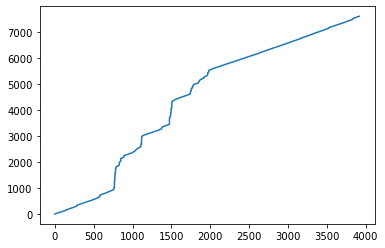

In [88]:
plt.plot(cuts_number)

#### Получаем следующий результат по разделению видео

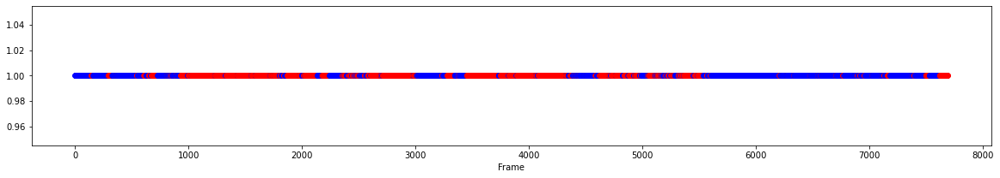

In [73]:
fig = plt.figure()
fig.set_figheight(3)
fig.set_figwidth(20)

ax = fig.add_subplot(111)
for frame in range(len(df["Frame"])):
    result = cuts_number.count(df["Frame"][frame])
    if result > 0:
        ax.scatter(df["Frame"][frame],1, color='blue', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1, color='red', linewidth= 0.5)

ax.set_xlabel("Frame")
plt.show()

#### Сравним с разделением, которые выполнил бы человек (смотрим только на первые 300 кадров)

In [74]:
# Секунды, на которых происходит смена действия (по моему мнению)
my_cuts_number = [6,16,27,40,52,70,80,100,120,130,164,172,178,184,225,300]

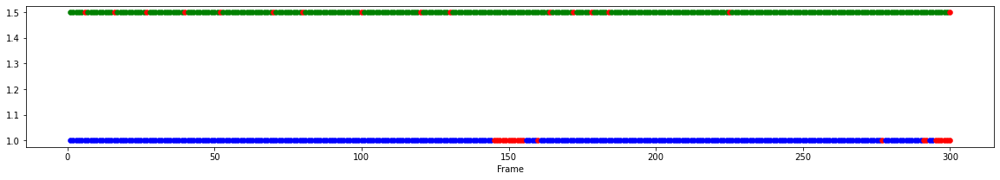

In [89]:
fig = plt.figure()
fig.set_figheight(3)
fig.set_figwidth(20)

ax = fig.add_subplot(111)
for frame in range(300):
    result = cuts_number.count(df["Frame"][frame])
    if result > 0:
        ax.scatter(df["Frame"][frame],1, color='blue', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1, color='red', linewidth= 0.5)
        
    result2 = my_cuts_number.count(df["Frame"][frame])
    if result2 > 0:
        ax.scatter(df["Frame"][frame],1.5, color='red', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1.5, color='green', linewidth= 0.5)

ax.set_xlabel("Frame")
plt.show()

#### Результат далек от ожидаемого. Возможно из-за того, что определяли изменение значений по левой руке. Попробуем использовать правую.

In [90]:
cuts_number = sub_video(df['Right Hand index'], df)

Всего отрезков: 2626
Длина массива: 2626
[126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 147, 148, 149, 150, 151, 152, 153, 154, 163, 164, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219, 220, 221, 222, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 237, 238, 239, 240, 241, 242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254, 255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 269, 270, 271, 272, 273, 274, 275, 324, 325, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345, 346, 347, 348, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371, 372, 373, 374, 375, 376, 377, 378, 379, 395, 396, 397, 398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 420, 421, 422, 423, 424, 425, 426, 427

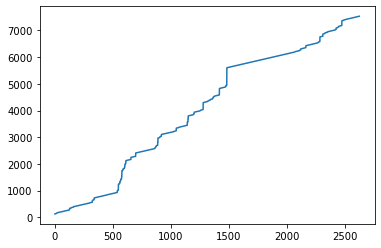

In [91]:
plt.plot(cuts_number)

#### Получаем следующий результат по разделению видео по правой руке

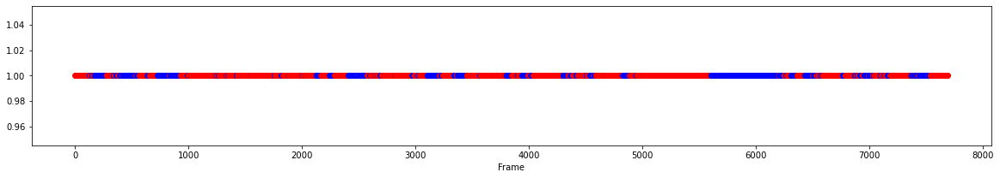

In [83]:
fig = plt.figure()
fig.set_figheight(3)
fig.set_figwidth(20)

ax = fig.add_subplot(111)
for frame in range(len(df["Frame"])):
    result = cuts_number.count(df["Frame"][frame])
    if result > 0:
        ax.scatter(df["Frame"][frame],1, color='blue', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1, color='red', linewidth= 0.5)

ax.set_xlabel("Frame")
plt.show()

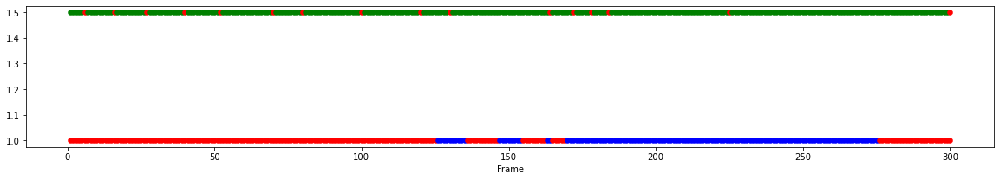

In [92]:
fig = plt.figure()
fig.set_figheight(3)
fig.set_figwidth(20)

ax = fig.add_subplot(111)
for frame in range(300):
    result = cuts_number.count(df["Frame"][frame])
    if result > 0:
        ax.scatter(df["Frame"][frame],1, color='blue', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1, color='red', linewidth= 0.5)
        
    result2 = my_cuts_number.count(df["Frame"][frame])
    if result2 > 0:
        ax.scatter(df["Frame"][frame],1.5, color='red', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1.5, color='green', linewidth= 0.5)

ax.set_xlabel("Frame")
plt.show()

#### Теперь попробуем учесть обе руки. Будем отделять кадр при условии, что хотя бы одна рука вышла из кадра

In [94]:
def sub_video_with_both_two_hands(left_hand_data, right_hand_data, dataframe):
    counter = 0
    cuts_number = []
    for i in range(0, len(dataframe)):
        if i+1 == len(dataframe):
            break
        else:
            if (left_hand_data[i+1] == left_hand_data[i]) and (right_hand_data[i+1] == right_hand_data[i]):
                continue
            else:
                #print(dataframe.index[i])
                counter+=1
                cuts_number.append(dataframe.index[i])
    print("Всего отрезков:", counter)
    print("Длина массива:",len(cuts_number))
    #print(cuts_number)
    return cuts_number

In [95]:
cuts_number_two_hands = sub_video_with_both_two_hands(df['Left Hand index'], df['Right Hand index'], df)

Всего отрезков: 4547
Длина массива: 4547


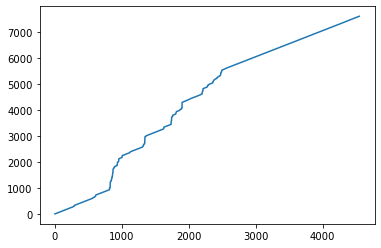

In [96]:
plt.plot(cuts_number_two_hands)

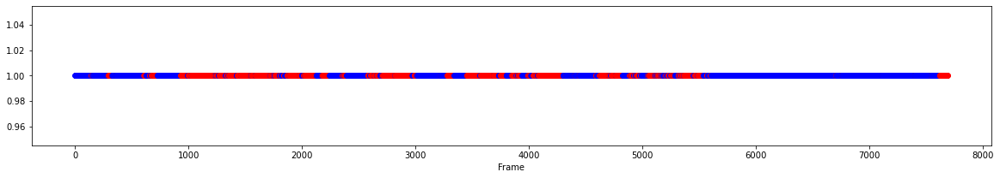

In [97]:
fig = plt.figure()
fig.set_figheight(3)
fig.set_figwidth(20)

ax = fig.add_subplot(111)
for frame in range(len(df["Frame"])):
    result = cuts_number_two_hands.count(df["Frame"][frame])
    if result > 0:
        ax.scatter(df["Frame"][frame],1, color='blue', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1, color='red', linewidth= 0.5)

ax.set_xlabel("Frame")
plt.show()

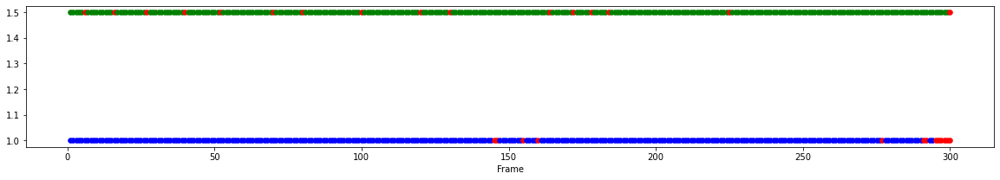

In [98]:
fig = plt.figure()
fig.set_figheight(3)
fig.set_figwidth(20)

ax = fig.add_subplot(111)
for frame in range(300):
    result = cuts_number_two_hands.count(df["Frame"][frame])
    if result > 0:
        ax.scatter(df["Frame"][frame],1, color='blue', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1, color='red', linewidth= 0.5)
        
    result2 = my_cuts_number.count(df["Frame"][frame])
    if result2 > 0:
        ax.scatter(df["Frame"][frame],1.5, color='red', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1.5, color='green', linewidth= 0.5)

ax.set_xlabel("Frame")
plt.show()

#### Теперь попробуем учесть обе руки. Будем отделять кадр при условии, что обе руки вышли из кадра

In [99]:
def sub_video_with_any_hands(left_hand_data, right_hand_data, dataframe):
    counter = 0
    cuts_number = []
    for i in range(0, len(dataframe)):
        if i+1 == len(dataframe):
            break
        else:
            if (left_hand_data[i+1] == left_hand_data[i]) or (right_hand_data[i+1] == right_hand_data[i]):
                continue
            else:
                #print(dataframe.index[i])
                counter+=1
                cuts_number.append(dataframe.index[i])
    print("Всего отрезков:", counter)
    print("Длина массива:",len(cuts_number))
    #print(cuts_number)
    return cuts_number

In [100]:
cuts_number_two_hands = sub_video_with_any_hands(df['Left Hand index'], df['Right Hand index'], df)

Всего отрезков: 1999
Длина массива: 1999


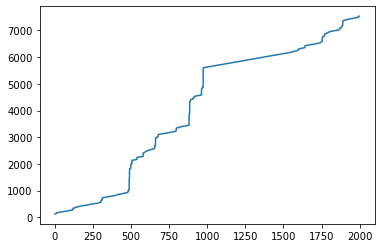

In [101]:
plt.plot(cuts_number_two_hands)

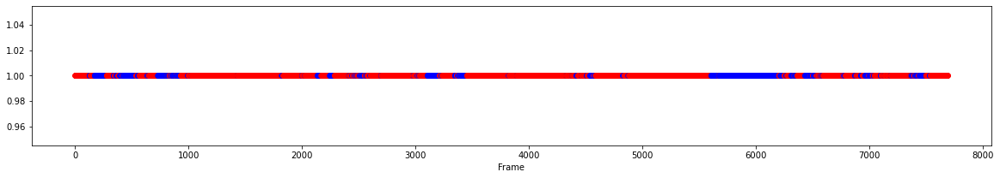

In [102]:
fig = plt.figure()
fig.set_figheight(3)
fig.set_figwidth(20)

ax = fig.add_subplot(111)
for frame in range(len(df["Frame"])):
    result = cuts_number_two_hands.count(df["Frame"][frame])
    if result > 0:
        ax.scatter(df["Frame"][frame],1, color='blue', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1, color='red', linewidth= 0.5)

ax.set_xlabel("Frame")
plt.show()

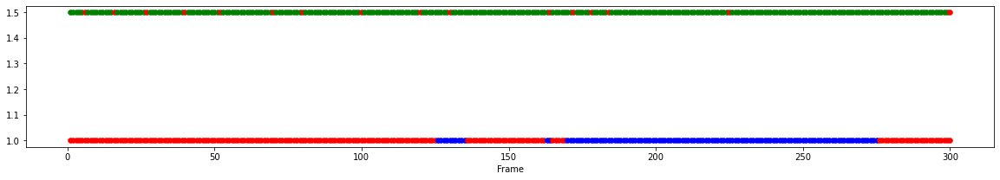

In [103]:
fig = plt.figure()
fig.set_figheight(3)
fig.set_figwidth(20)

ax = fig.add_subplot(111)
for frame in range(300):
    result = cuts_number_two_hands.count(df["Frame"][frame])
    if result > 0:
        ax.scatter(df["Frame"][frame],1, color='blue', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1, color='red', linewidth= 0.5)
        
    result2 = my_cuts_number.count(df["Frame"][frame])
    if result2 > 0:
        ax.scatter(df["Frame"][frame],1.5, color='red', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1.5, color='green', linewidth= 0.5)

ax.set_xlabel("Frame")
plt.show()

#### Построим графики, чтобы посмотреть как изменялись положения точек руки во времени

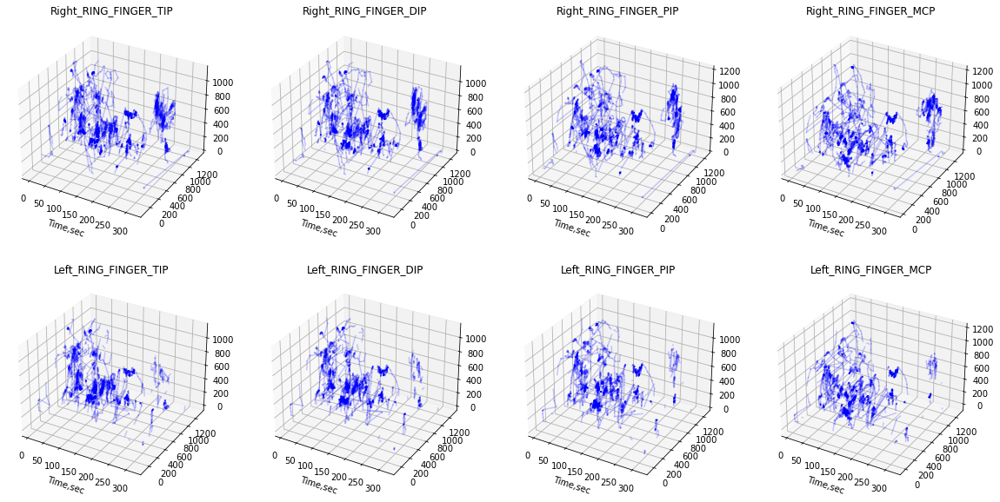

In [105]:
# define subplot grid
fig = plt.figure()
fig.set_figheight(20)
fig.set_figwidth(20)

ax1 = fig.add_subplot(141, projection='3d')
ax2 = fig.add_subplot(142, projection='3d')
ax3 = fig.add_subplot(143, projection='3d')
ax4 = fig.add_subplot(144, projection='3d')

ax_1 = fig.add_subplot(241, projection='3d')
ax_2 = fig.add_subplot(242, projection='3d')
ax_3 = fig.add_subplot(243, projection='3d')
ax_4 = fig.add_subplot(244, projection='3d')

for i in range(len(df)-1):
    ax1.plot(df['Time,sec'][i:i+2],df['Left_RING_FINGER_TIP_X'][i:i+2],df['Left_RING_FINGER_TIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax1.set_title('Left_RING_FINGER_TIP')
    ax1.set_xlabel("Time,sec")  
    
    ax2.plot(df['Time,sec'][i:i+2],df['Left_RING_FINGER_DIP_X'][i:i+2],df['Left_RING_FINGER_DIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax2.set_title('Left_RING_FINGER_DIP')
    ax2.set_xlabel("Time,sec")  
    
    ax3.plot(df['Time,sec'][i:i+2],df['Left_RING_FINGER_PIP_X'][i:i+2],df['Left_RING_FINGER_PIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax3.set_title('Left_RING_FINGER_PIP')
    ax3.set_xlabel("Time,sec")  
    
    ax4.plot(df['Time,sec'][i:i+2],df['Left_RING_FINGER_MCP_X'][i:i+2],df['Left_RING_FINGER_MCP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax4.set_title('Left_RING_FINGER_MCP')
    ax4.set_xlabel("Time,sec")
    
    ax_1.plot(df['Time,sec'][i:i+2],df['Right_RING_FINGER_TIP_X'][i:i+2],df['Right_RING_FINGER_TIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_1.set_title('Right_RING_FINGER_TIP')
    ax_1.set_xlabel("Time,sec")  
    
    ax_2.plot(df['Time,sec'][i:i+2],df['Right_RING_FINGER_DIP_X'][i:i+2],df['Right_RING_FINGER_DIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_2.set_title('Right_RING_FINGER_DIP')
    ax_2.set_xlabel("Time,sec")  
    
    ax_3.plot(df['Time,sec'][i:i+2],df['Right_RING_FINGER_PIP_X'][i:i+2],df['Right_RING_FINGER_PIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_3.set_title('Right_RING_FINGER_PIP')
    ax_3.set_xlabel("Time,sec")  
    
    ax_4.plot(df['Time,sec'][i:i+2],df['Right_RING_FINGER_MCP_X'][i:i+2],df['Right_RING_FINGER_MCP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_4.set_title('Right_RING_FINGER_MCP')
    ax_4.set_xlabel("Time,sec")

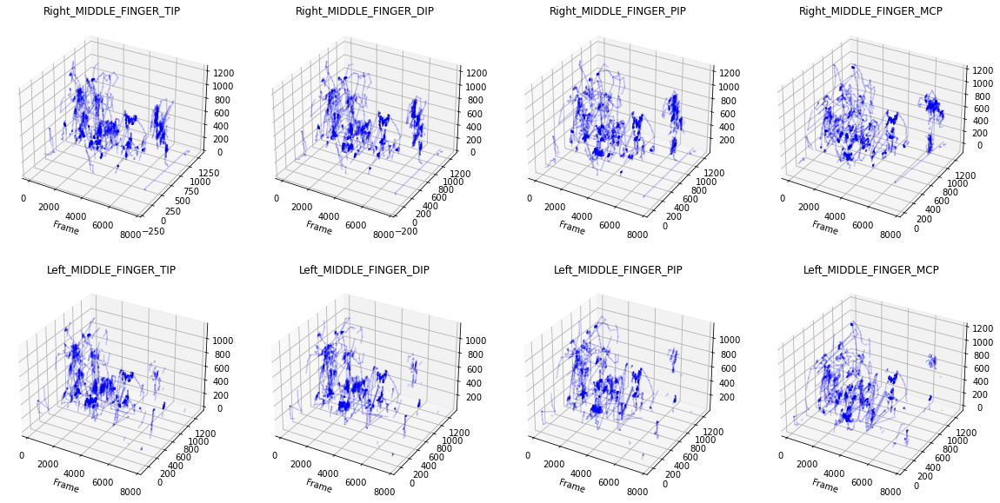

In [106]:
# define subplot grid
fig = plt.figure()
fig.set_figheight(20)
fig.set_figwidth(20)

ax5 = fig.add_subplot(141, projection='3d')
ax6 = fig.add_subplot(142, projection='3d')
ax7 = fig.add_subplot(143, projection='3d')
ax8 = fig.add_subplot(144, projection='3d')

ax_5 = fig.add_subplot(241, projection='3d')
ax_6 = fig.add_subplot(242, projection='3d')
ax_7 = fig.add_subplot(243, projection='3d')
ax_8 = fig.add_subplot(244, projection='3d')

for i in range(len(df)-1):
    ax5.plot(df['Frame'][i:i+2],df['Left_MIDDLE_FINGER_TIP_X'][i:i+2],df['Left_MIDDLE_FINGER_TIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax5.set_title('Left_MIDDLE_FINGER_TIP')
    ax5.set_xlabel("Frame")  
    
    ax6.plot(df['Frame'][i:i+2],df['Left_MIDDLE_FINGER_DIP_X'][i:i+2],df['Left_MIDDLE_FINGER_DIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax6.set_title('Left_MIDDLE_FINGER_DIP')
    ax6.set_xlabel("Frame")  
    
    ax7.plot(df['Frame'][i:i+2],df['Left_MIDDLE_FINGER_PIP_X'][i:i+2],df['Left_MIDDLE_FINGER_PIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax7.set_title('Left_MIDDLE_FINGER_PIP')
    ax7.set_xlabel("Frame")  
    
    ax8.plot(df['Frame'][i:i+2],df['Left_MIDDLE_FINGER_MCP_X'][i:i+2],df['Left_MIDDLE_FINGER_MCP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax8.set_title('Left_MIDDLE_FINGER_MCP')
    ax8.set_xlabel("Frame")
    
    ax_5.plot(df['Frame'][i:i+2],df['Right_MIDDLE_FINGER_TIP_X'][i:i+2],df['Right_MIDDLE_FINGER_TIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_5.set_title('Right_MIDDLE_FINGER_TIP')
    ax_5.set_xlabel("Frame")  
    
    ax_6.plot(df['Frame'][i:i+2],df['Right_MIDDLE_FINGER_DIP_X'][i:i+2],df['Right_MIDDLE_FINGER_DIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_6.set_title('Right_MIDDLE_FINGER_DIP')
    ax_6.set_xlabel("Frame")  
    
    ax_7.plot(df['Frame'][i:i+2],df['Right_MIDDLE_FINGER_PIP_X'][i:i+2],df['Right_MIDDLE_FINGER_PIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_7.set_title('Right_MIDDLE_FINGER_PIP')
    ax_7.set_xlabel("Frame")  
    
    ax_8.plot(df['Frame'][i:i+2],df['Right_MIDDLE_FINGER_MCP_X'][i:i+2],df['Right_MIDDLE_FINGER_MCP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_8.set_title('Right_MIDDLE_FINGER_MCP')
    ax_8.set_xlabel("Frame")

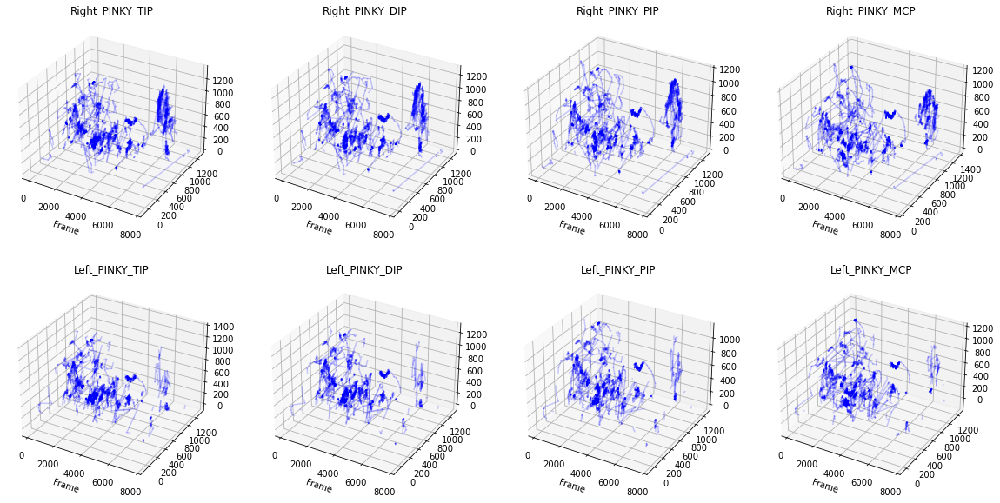

In [107]:
# define subplot grid
fig = plt.figure()
fig.set_figheight(20)
fig.set_figwidth(20)

ax9 = fig.add_subplot(141, projection='3d')
ax10 = fig.add_subplot(142, projection='3d')
ax11 = fig.add_subplot(143, projection='3d')
ax12 = fig.add_subplot(144, projection='3d')

ax_9 = fig.add_subplot(241, projection='3d')
ax_10 = fig.add_subplot(242, projection='3d')
ax_11 = fig.add_subplot(243, projection='3d')
ax_12 = fig.add_subplot(244, projection='3d')

for i in range(len(df)-1):
    ax9.plot(df['Frame'][i:i+2],df['Left_PINKY_TIP_X'][i:i+2],df['Left_PINKY_TIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax9.set_title('Left_PINKY_TIP')
    ax9.set_xlabel("Frame")  
    
    ax10.plot(df['Frame'][i:i+2],df['Left_PINKY_DIP_X'][i:i+2],df['Left_PINKY_DIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax10.set_title('Left_PINKY_DIP')
    ax10.set_xlabel("Frame")  
    
    ax11.plot(df['Frame'][i:i+2],df['Left_PINKY_PIP_X'][i:i+2],df['Left_PINKY_PIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax11.set_title('Left_PINKY_PIP')
    ax11.set_xlabel("Frame")  
    
    ax12.plot(df['Frame'][i:i+2],df['Left_PINKY_MCP_X'][i:i+2],df['Left_PINKY_MCP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax12.set_title('Left_PINKY_MCP')
    ax12.set_xlabel("Frame")
    
    ax_9.plot(df['Frame'][i:i+2],df['Right_PINKY_TIP_X'][i:i+2],df['Right_PINKY_TIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_9.set_title('Right_PINKY_TIP')
    ax_9.set_xlabel("Frame")  
    
    ax_10.plot(df['Frame'][i:i+2],df['Right_PINKY_DIP_X'][i:i+2],df['Right_PINKY_DIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_10.set_title('Right_PINKY_DIP')
    ax_10.set_xlabel("Frame")  
    
    ax_11.plot(df['Frame'][i:i+2],df['Right_PINKY_PIP_X'][i:i+2],df['Right_PINKY_PIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_11.set_title('Right_PINKY_PIP')
    ax_11.set_xlabel("Frame")  
    
    ax_12.plot(df['Frame'][i:i+2],df['Right_PINKY_MCP_X'][i:i+2],df['Right_PINKY_MCP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_12.set_title('Right_PINKY_MCP')
    ax_12.set_xlabel("Frame")

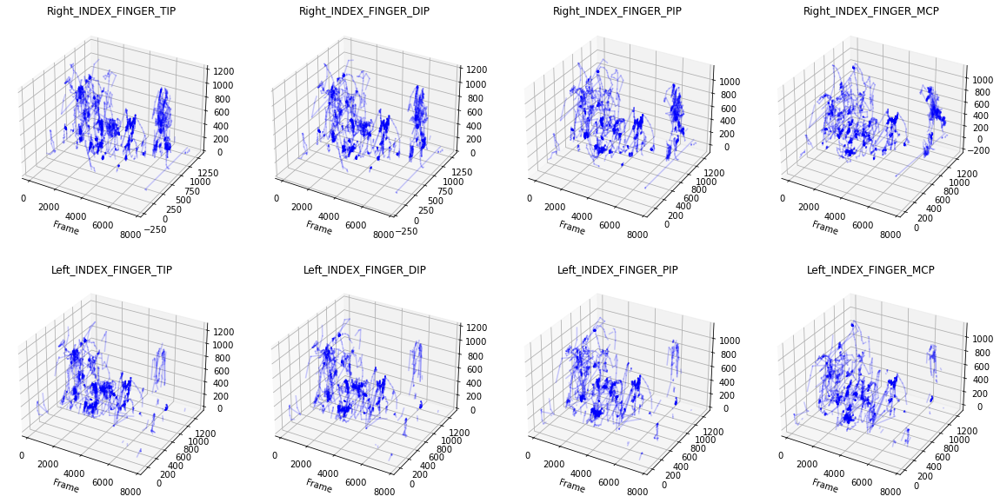

In [108]:
# define subplot grid
fig = plt.figure()
fig.set_figheight(20)
fig.set_figwidth(20)

ax13 = fig.add_subplot(141, projection='3d')
ax14 = fig.add_subplot(142, projection='3d')
ax15 = fig.add_subplot(143, projection='3d')
ax16 = fig.add_subplot(144, projection='3d')

ax_13 = fig.add_subplot(241, projection='3d')
ax_14 = fig.add_subplot(242, projection='3d')
ax_15 = fig.add_subplot(243, projection='3d')
ax_16 = fig.add_subplot(244, projection='3d')

for i in range(len(df)-1):
    ax13.plot(df['Frame'][i:i+2],df['Left_INDEX_FINGER_TIP_X'][i:i+2],df['Left_INDEX_FINGER_TIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax13.set_title('Left_INDEX_FINGER_TIP')
    ax13.set_xlabel("Frame")  
    
    ax14.plot(df['Frame'][i:i+2],df['Left_INDEX_FINGER_DIP_X'][i:i+2],df['Left_INDEX_FINGER_DIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax14.set_title('Left_INDEX_FINGER_DIP')
    ax14.set_xlabel("Frame")  
    
    ax15.plot(df['Frame'][i:i+2],df['Left_INDEX_FINGER_PIP_X'][i:i+2],df['Left_INDEX_FINGER_PIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax15.set_title('Left_INDEX_FINGER_PIP')
    ax15.set_xlabel("Frame")  
    
    ax16.plot(df['Frame'][i:i+2],df['Left_INDEX_FINGER_MCP_X'][i:i+2],df['Left_INDEX_FINGER_MCP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax16.set_title('Left_INDEX_FINGER_MCP')
    ax16.set_xlabel("Frame")
    
    ax_13.plot(df['Frame'][i:i+2],df['Right_INDEX_FINGER_TIP_X'][i:i+2],df['Right_INDEX_FINGER_TIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_13.set_title('Right_INDEX_FINGER_TIP')
    ax_13.set_xlabel("Frame")  
    
    ax_14.plot(df['Frame'][i:i+2],df['Right_INDEX_FINGER_DIP_X'][i:i+2],df['Right_INDEX_FINGER_DIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_14.set_title('Right_INDEX_FINGER_DIP')
    ax_14.set_xlabel("Frame")  
    
    ax_15.plot(df['Frame'][i:i+2],df['Right_INDEX_FINGER_PIP_X'][i:i+2],df['Right_INDEX_FINGER_PIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_15.set_title('Right_INDEX_FINGER_PIP')
    ax_15.set_xlabel("Frame")  
    
    ax_16.plot(df['Frame'][i:i+2],df['Right_INDEX_FINGER_MCP_X'][i:i+2],df['Right_INDEX_FINGER_MCP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_16.set_title('Right_INDEX_FINGER_MCP')
    ax_16.set_xlabel("Frame")

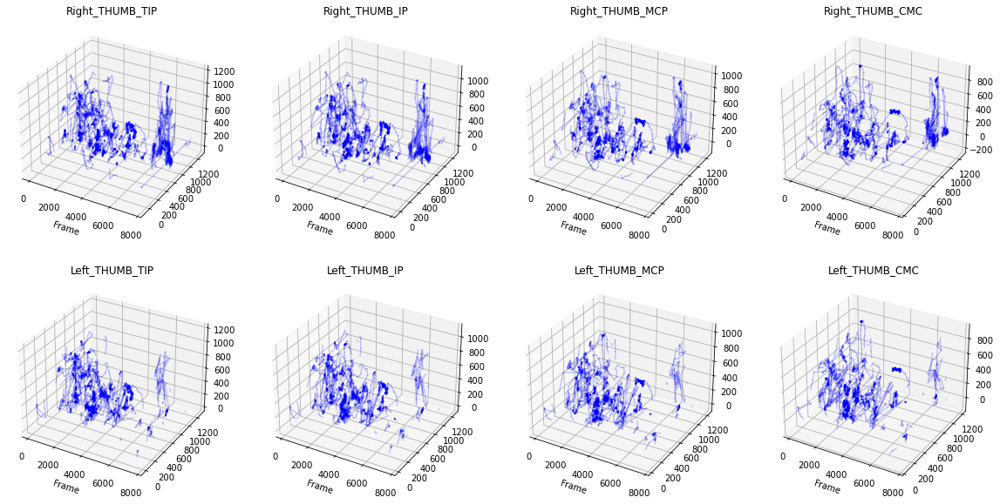

In [109]:
# define subplot grid
fig = plt.figure()
fig.set_figheight(20)
fig.set_figwidth(20)

ax17 = fig.add_subplot(141, projection='3d')
ax18 = fig.add_subplot(142, projection='3d')
ax19 = fig.add_subplot(143, projection='3d')
ax20 = fig.add_subplot(144, projection='3d')

ax_17 = fig.add_subplot(241, projection='3d')
ax_18 = fig.add_subplot(242, projection='3d')
ax_19 = fig.add_subplot(243, projection='3d')
ax_20 = fig.add_subplot(244, projection='3d')

for i in range(len(df)-1):
    ax17.plot(df['Frame'][i:i+2],df['Left_THUMB_TIP_X'][i:i+2],df['Left_THUMB_TIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax17.set_title('Left_THUMB_TIP')
    ax17.set_xlabel("Frame")  
    
    ax18.plot(df['Frame'][i:i+2],df['Left_THUMB_IP_X'][i:i+2],df['Left_THUMB_IP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax18.set_title('Left_THUMB_IP')
    ax18.set_xlabel("Frame")  
    
    ax19.plot(df['Frame'][i:i+2],df['Left_THUMB_MCP_X'][i:i+2],df['Left_THUMB_MCP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax19.set_title('Left_THUMB_MCP')
    ax19.set_xlabel("Frame")  
    
    ax20.plot(df['Frame'][i:i+2],df['Left_THUMB_CMC_X'][i:i+2],df['Left_THUMB_CMC_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax20.set_title('Left_THUMB_CMC')
    ax20.set_xlabel("Frame")
    
    ax_17.plot(df['Frame'][i:i+2],df['Right_THUMB_TIP_X'][i:i+2],df['Right_THUMB_TIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_17.set_title('Right_THUMB_TIP')
    ax_17.set_xlabel("Frame")  
    
    ax_18.plot(df['Frame'][i:i+2],df['Right_THUMB_IP_X'][i:i+2],df['Right_THUMB_IP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_18.set_title('Right_THUMB_IP')
    ax_18.set_xlabel("Frame")  
    
    ax_19.plot(df['Frame'][i:i+2],df['Right_THUMB_MCP_X'][i:i+2],df['Right_THUMB_MCP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_19.set_title('Right_THUMB_MCP')
    ax_19.set_xlabel("Frame")  
    
    ax_20.plot(df['Frame'][i:i+2],df['Right_THUMB_CMC_X'][i:i+2],df['Right_THUMB_CMC_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax_20.set_title('Right_THUMB_CMC')
    ax_20.set_xlabel("Frame")

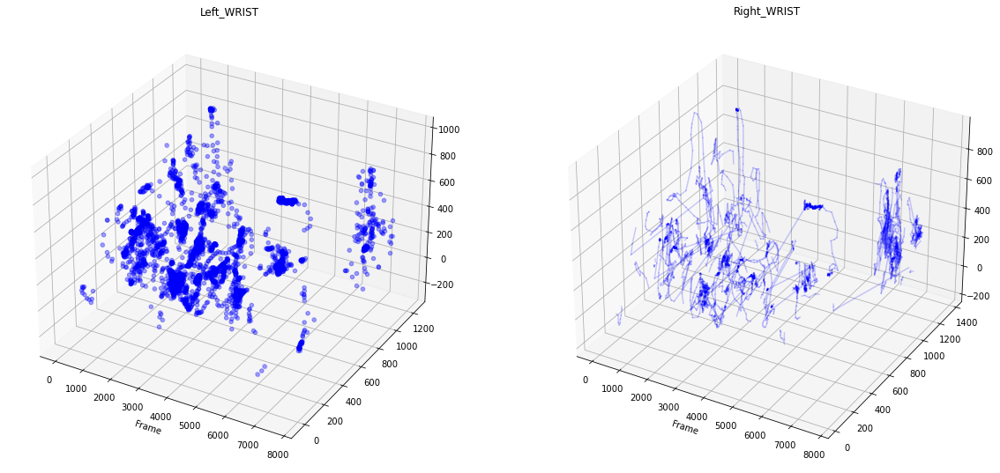

In [110]:
# define subplot grid
fig = plt.figure()
fig.set_figheight(20)
fig.set_figwidth(20)

ax21 = fig.add_subplot(121, projection='3d')
ax22 = fig.add_subplot(122, projection='3d')

for i in range(len(df)-1):
    ax21.scatter(df['Frame'][i:i+2],df['Left_WRIST_X'][i:i+2],df['Left_WRIST_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax21.set_title('Left_WRIST')
    ax21.set_xlabel("Frame")
    
    ax22.plot(df['Frame'][i:i+2],df['Right_WRIST_X'][i:i+2],df['Right_WRIST_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax22.set_title('Right_WRIST')
    ax22.set_xlabel("Frame")

#### Отобразим значения по левой и правой руке на одном графике

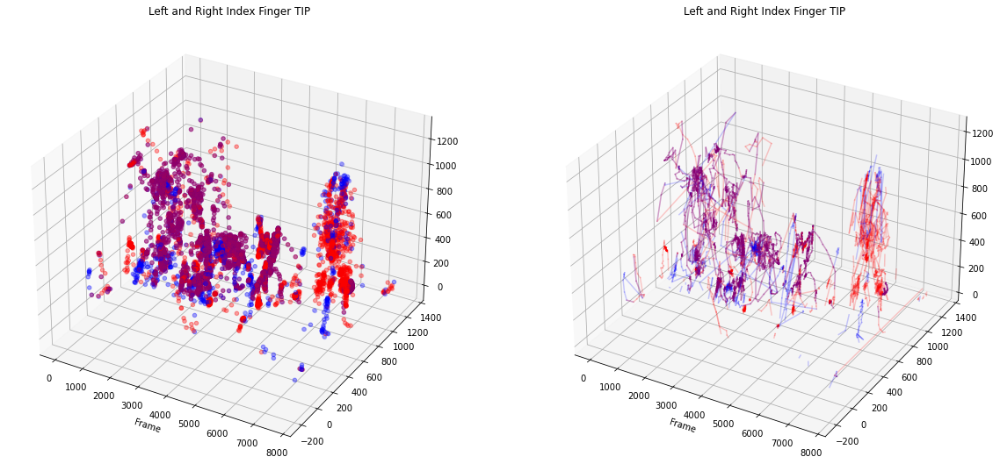

In [111]:
# define subplot grid
fig = plt.figure()
fig.set_figheight(20)
fig.set_figwidth(20)

ax21 = fig.add_subplot(121, projection='3d')
ax22 = fig.add_subplot(122, projection='3d')

for i in range(len(df)-1):
    ax21.scatter(df['Frame'][i:i+2],df['Left_INDEX_FINGER_TIP_X'][i:i+2],df['Left_INDEX_FINGER_TIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax21.scatter(df['Frame'][i:i+2],df['Right_INDEX_FINGER_TIP_X'][i:i+2],df['Right_INDEX_FINGER_TIP_Y'][i:i+2],alpha=0.2,color = 'red')
    ax21.set_title('Left and Right Index Finger TIP')
    ax21.set_xlabel("Frame")
    
    ax22.plot(df['Frame'][i:i+2],df['Left_INDEX_FINGER_TIP_X'][i:i+2],df['Left_INDEX_FINGER_TIP_Y'][i:i+2],alpha=0.2,color = 'blue')
    ax22.plot(df['Frame'][i:i+2],df['Right_INDEX_FINGER_TIP_X'][i:i+2],df['Right_INDEX_FINGER_TIP_Y'][i:i+2],alpha=0.2,color = 'red')
    ax22.set_title('Left and Right Index Finger TIP')
    ax22.set_xlabel("Frame")

plt.show()

#### Можно посмотреть на график в 3D

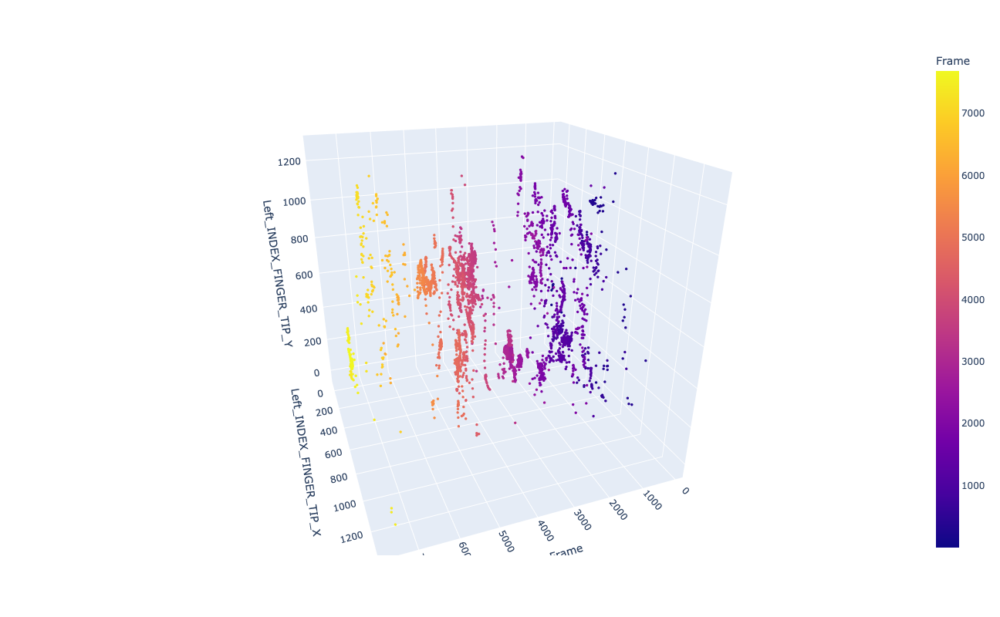

In [112]:
import plotly.express as px

fig = px.scatter_3d(df, x='Frame', y='Left_INDEX_FINGER_TIP_X', z='Left_INDEX_FINGER_TIP_Y',
                    color='Frame',width=900, height=800)
fig.update_traces(marker_size = 2)
fig.show()

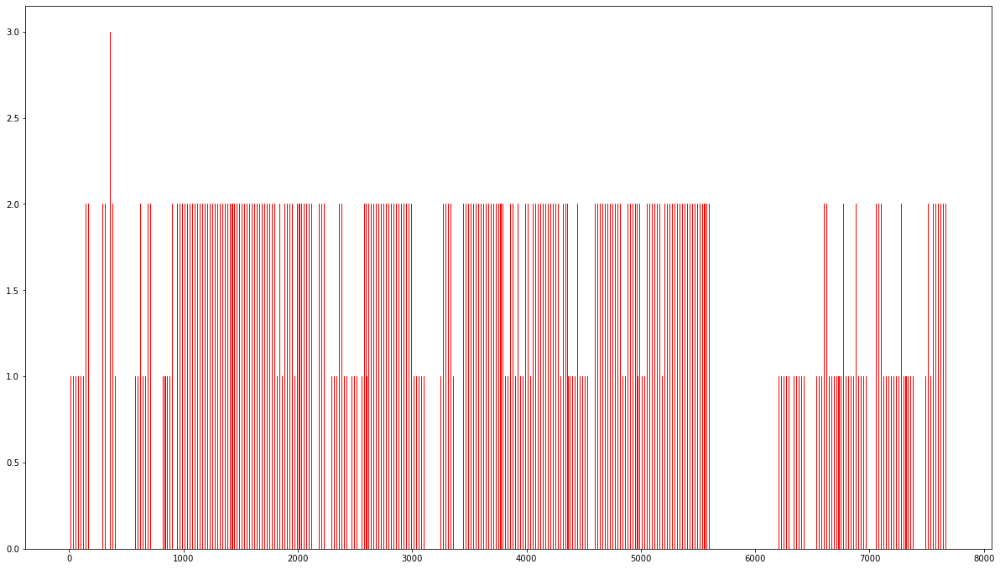

In [313]:
width = 0.35
fig = plt.figure(figsize=(16,9))
ax = fig.add_axes([0,0,1,1])
ax.bar(df["Frame"], df["Num Hands in frame"], width, color='r')
plt.show()

#### Попробуем посмотреть на графики под другим углом, чтобы узнать, можно ли выделить характерные позиции, по которым можно разделить значения. Для работы PCA необходимо заполнить пропуски в данных (Nan), когда в кадрах не было обнаружено рук

In [115]:
df_withoutNan = df.fillna(0)

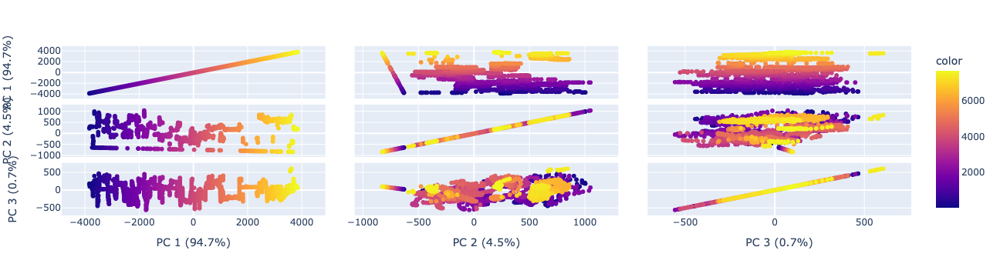

In [132]:
import plotly.express as px
from sklearn.decomposition import PCA

#features = ['Frame','Left_RING_FINGER_TIP_X','Left_RING_FINGER_TIP_Y','Right_RING_FINGER_TIP_X','Right_RING_FINGER_TIP_Y']
features = ['Frame','Xmax','Xmin','Ymax','Ymin']

pca = PCA()
components = pca.fit_transform(df_withoutNan[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(3),
    color=df["Frame"]
)
fig.update_traces(diagonal_visible=True)
fig.show()

#### Как после такого преобразования выделить кадры не ясно, но попробовать и проверить нужно было

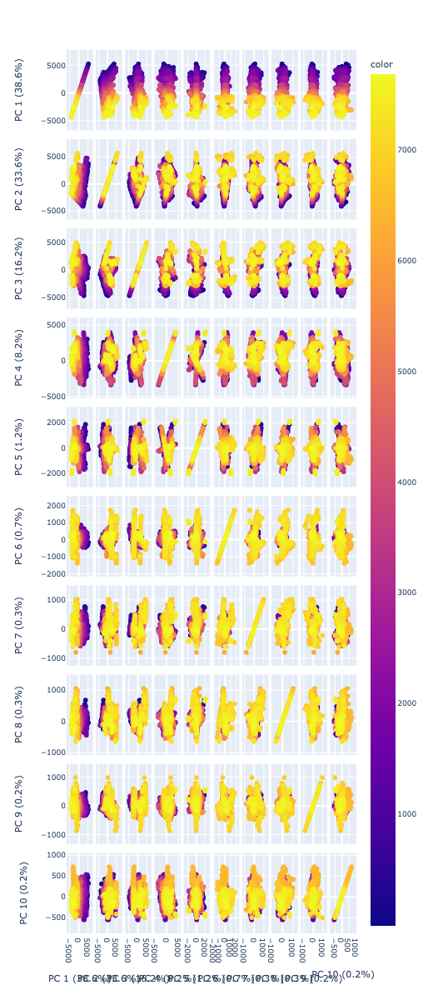

In [131]:
import plotly.express as px
from sklearn.decomposition import PCA

features = [
'Frame',
                           'Num Hands in frame',
                           'Left Hand index',
                           'Right Hand index',
                           'Left_RING_FINGER_TIP_X','Left_RING_FINGER_TIP_Y','Left_RING_FINGER_DIP_X','Left_RING_FINGER_DIP_Y','Left_RING_FINGER_PIP_X','Left_RING_FINGER_PIP_Y','Left_RING_FINGER_MCP_X','Left_RING_FINGER_MCP_Y',
                           'Left_MIDDLE_FINGER_TIP_X','Left_MIDDLE_FINGER_TIP_Y','Left_MIDDLE_FINGER_DIP_X','Left_MIDDLE_FINGER_DIP_Y','Left_MIDDLE_FINGER_PIP_X','Left_MIDDLE_FINGER_PIP_Y','Left_MIDDLE_FINGER_MCP_X','Left_MIDDLE_FINGER_MCP_Y',
                           'Left_PINKY_TIP_X','Left_PINKY_TIP_Y','Left_PINKY_DIP_X','Left_PINKY_DIP_Y','Left_PINKY_PIP_X','Left_PINKY_PIP_Y','Left_PINKY_MCP_X','Left_PINKY_MCP_Y',
                           'Left_INDEX_FINGER_TIP_X','Left_INDEX_FINGER_TIP_Y','Left_INDEX_FINGER_DIP_X','Left_INDEX_FINGER_DIP_Y','Left_INDEX_FINGER_PIP_X','Left_INDEX_FINGER_PIP_Y','Left_INDEX_FINGER_MCP_X','Left_INDEX_FINGER_MCP_Y',
                           'Left_THUMB_TIP_X','Left_THUMB_TIP_Y','Left_THUMB_IP_X','Left_THUMB_IP_Y','Left_THUMB_MCP_X','Left_THUMB_MCP_Y','Left_THUMB_CMC_X','Left_THUMB_CMC_Y',
                           'Left_WRIST_X', 'Left_WRIST_Y',
                           'Right_RING_FINGER_TIP_X','Right_RING_FINGER_TIP_Y','Right_RING_FINGER_DIP_X','Right_RING_FINGER_DIP_Y','Right_RING_FINGER_PIP_X','Right_RING_FINGER_PIP_Y','Right_RING_FINGER_MCP_X','Right_RING_FINGER_MCP_Y',
                           'Right_MIDDLE_FINGER_TIP_X','Right_MIDDLE_FINGER_TIP_Y','Right_MIDDLE_FINGER_DIP_X','Right_MIDDLE_FINGER_DIP_Y','Right_MIDDLE_FINGER_PIP_X','Right_MIDDLE_FINGER_PIP_Y','Right_MIDDLE_FINGER_MCP_X','Right_MIDDLE_FINGER_MCP_Y',
                           'Right_PINKY_TIP_X','Right_PINKY_TIP_Y','Right_PINKY_DIP_X','Right_PINKY_DIP_Y','Right_PINKY_PIP_X','Right_PINKY_PIP_Y','Right_PINKY_MCP_X','Right_PINKY_MCP_Y',
                           'Right_INDEX_FINGER_TIP_X','Right_INDEX_FINGER_TIP_Y','Right_INDEX_FINGER_DIP_X','Right_INDEX_FINGER_DIP_Y','Right_INDEX_FINGER_PIP_X','Right_INDEX_FINGER_PIP_Y','Right_INDEX_FINGER_MCP_X','Right_INDEX_FINGER_MCP_Y',
                           'Right_THUMB_TIP_X','Right_THUMB_TIP_Y','Right_THUMB_IP_X','Right_THUMB_IP_Y','Right_THUMB_MCP_X','Right_THUMB_MCP_Y','Right_THUMB_CMC_X','Right_THUMB_CMC_Y',
                           'Right_WRIST_X', 'Right_WRIST_Y',
                           'Xmax', 'Xmin', 'Ymax', 'Ymin']
#features = ['Frame','Xmax','Xmin','Ymax','Ymin']

pca = PCA()
components = pca.fit_transform(df_withoutNan[features])
labels = {
    str(i): f"PC {i+1} ({var:.1f}%)"
    for i, var in enumerate(pca.explained_variance_ratio_ * 100)
}

fig = px.scatter_matrix(
    components,
    labels=labels,
    dimensions=range(10),
    color=df["Frame"],
    width=1200, height=1200
)
fig.update_traces(diagonal_visible=True)
fig.update_layout(
    font=dict(
        size=9
    )
)
fig.show()

#### Выделим отдельно координаты прямоугольников вокруг руки в кадре и поробуем их проанализировать

In [136]:
df_rect = df[["Xmax","Xmin","Ymax","Ymin"]]

In [137]:
df_rect

,Xmax,Xmin,Ymax,Ymin
0,737.0,494.0,153.0,7.0
1,728.0,469.0,152.0,1.0
2,731.0,492.0,142.0,-6.0
3,736.0,506.0,150.0,-2.0
4,727.0,495.0,168.0,2.0
...,...,...,...,...
7680,812.0,566.0,314.0,172.0
7681,814.0,567.0,316.0,174.0
7682,808.0,563.0,316.0,175.0
7683,813.0,560.0,315.0,174.0


#### Определим отрезки, на которых распознавание рук пропадает. Видим, что из 7685 строк ненулевыми являются только 5969, следовательно, остальные нулевые

In [323]:
df_rect.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7685 entries, 0 to 7684
Data columns (total 4 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Xmax    5969 non-null   float64
 1   Xmin    5969 non-null   float64
 2   Ymax    5969 non-null   float64
 3   Ymin    5969 non-null   float64
dtypes: float64(4)
memory usage: 558.2 KB


In [326]:
# Нулевые строки
df_rect[df_rect.isnull().any(1)]

,Xmax,Xmin,Ymax,Ymin
127,NaN,NaN,NaN,NaN
128,NaN,NaN,NaN,NaN
129,NaN,NaN,NaN,NaN
130,NaN,NaN,NaN,NaN
131,NaN,NaN,NaN,NaN
...,...,...,...,...
7529,NaN,NaN,NaN,NaN
7530,NaN,NaN,NaN,NaN
7531,NaN,NaN,NaN,NaN
7532,NaN,NaN,NaN,NaN


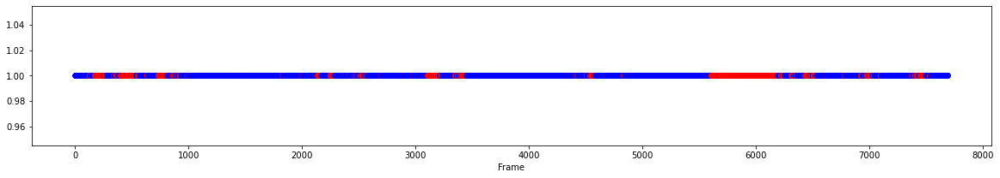

In [335]:
# Красным цветом выделены кадры, в которых отсутсвует выделение рук прямоугольником, те их модель не определила (или их вовсе нет)
fig = plt.figure()
fig.set_figheight(3)
fig.set_figwidth(20)

ax = fig.add_subplot(111)
nan_indexes = df_rect[df_rect.isnull().any(1)].index.tolist()
for frame in range(len(df_rect)):
    # Если индекс есть в датафрейме, выделяем его цветом
    result = nan_indexes.count(df["Frame"][frame])
    if result > 0:
        ax.scatter(df["Frame"][frame],1, color='red', linewidth= 0.5)
    else:
        ax.scatter(df["Frame"][frame],1, color='blue', linewidth= 0.5)
ax.set_xlabel("Frame")
plt.show()

#### На отрезках времени, где руки определены, посчитаем скорость передвижения прямоугольника по формуле: Скорость = Расстояние, пройденное пикселями от появления рук в кадре до их исчезновения, поделенное на время нахождения в кадре

In [361]:
from numpy.linalg import norm
frame_time = 0 # считаем продолжительность отрезка (время) in fps
start_index = 0
velocity_array = []
for frame in range(len(df)):
    # Если индекс есть в датафрейме, считаем скорость
    result = nan_indexes.count(df["Frame"][frame])
    if result > 0:
        end_index = frame
        velocity = norm(df_rect["Xmax"][start_index]-df_rect["Xmax"][end_index])/frame_time
        velocity_array.append(velocity)
        start_index = frame
        frame_time = 0
    else:
        frame_time = frame_time + 1
        

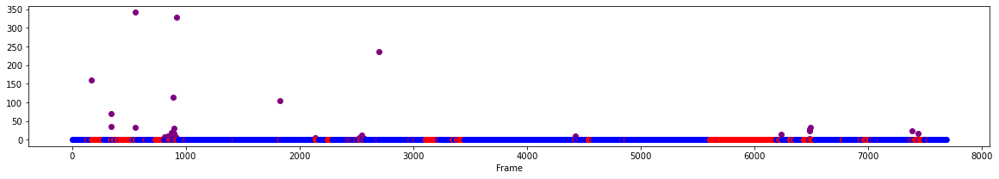

In [379]:

fig = plt.figure()
fig.set_figheight(3)
fig.set_figwidth(20)

ax = fig.add_subplot(111)
nan_indexes = df_rect[df_rect.isnull().any(1)].index.tolist()
v_ind = 0
for frame in range(len(df_rect)):
    # Если индекс есть в датафрейме, выделяем его цветом
    result = nan_indexes.count(df["Frame"][frame])
    if result > 0:
        ax.scatter(df["Frame"][frame],1, color='red', linewidth= 0.5)
        ax.scatter(df["Frame"][frame], velocity_array[v_ind], color='purple')
        v_ind = v_ind + 1
    else:
        ax.scatter(df["Frame"][frame],1, color='blue', linewidth= 0.5)
ax.set_xlabel("Frame")
plt.show()

In [372]:
len(velocity_array)

1716

In [146]:
distances = pdist(df_rect.values, metric='minkowski')
dist_matrix = squareform(distances)

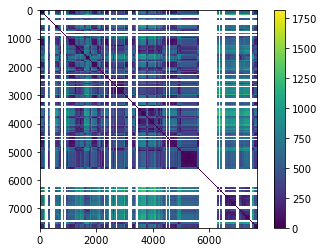

In [147]:
plt.imshow(dist_matrix, interpolation='none')
plt.colorbar()
plt.show()

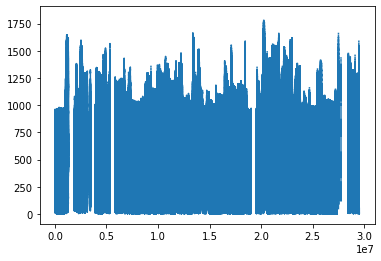

In [148]:
plt.plot(distances)

#### Dense Optical flow 
https://docs.opencv.org/3.4/d4/dee/tutorial_optical_flow.html

http://www.sefidian.com/2019/12/16/a-tutorial-on-motion-estimation-with-optical-flow-with-python-implementation/

Используется для определения векторов движения пикселей. 
Есть примеры статей, которые используют данный метод. Напрмиер: https://www.researchgate.net/publication/224390152_Design_and_implementation_of_an_optical_flow-based_autonomous_video_surveillance_system

In [383]:
import numpy as np
import pandas as pd
import cv2 as cv
#df_OpticalFlow = pd.DataFrame(columns=["RGB", "Gray", "Optical Flow"])
cap = cv.VideoCapture("/Users/vladislav/Documents/JupyterNotebook/ObjectDetection/Maintenance Hand Segmentation/Python Segmentation/pump_dataset/pump_videos/test_pump_video.mp4")
ret, frame1 = cap.read()
prvs = cv.cvtColor(frame1, cv.COLOR_BGR2GRAY)
hsv = np.zeros_like(frame1)
hsv[..., 1] = 255
flow_data = []
display_handle=display(None, display_id=True)
try:
    while(True):
        #data = {}
        ret, frame2 = cap.read()
        if not ret:
            print('No frames grabbed!')
            break
        next = cv.cvtColor(frame2, cv.COLOR_BGR2GRAY)
        flow = cv.calcOpticalFlowFarneback(prvs, next, None, 0.5, 3, 15, 3, 5, 1.2, 0)
        flow_data.append(np.linalg.norm(flow)) # Average optical flow vector magnitude, per frame
        mag, ang = cv.cartToPolar(flow[..., 0], flow[..., 1])
        hsv[..., 0] = ang*180/np.pi/2
        hsv[..., 2] = cv.normalize(mag, None, 0, 255, cv.NORM_MINMAX)
        bgr = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)
        #cv.imshow('frame2', bgr)
    
        #data.update({"RGB": frame2})
        #data.update({"Gray": next})
        #data.update({"Optical Flow": bgr})
        #df_OpticalFlow.loc[len(df_OpticalFlow)] = data
        
        
        # Display in notebook    
        _, frame = cv2.imencode('.jpeg', bgr)
        display_handle.update(Image(data=frame.tobytes()))
        
        prvs = next
except KeyboardInterrupt:
    pass
finally:
    cap.release()
    display_handle.update(None)

None

#### Посмотрим первые 300 кадров. Зелеными вертикальными линиями отметим места, которые выбраны как заведомо правильное место разделения видео. Можно заметить, что резкое увеличение значений примерно совпадает с верными значениями. Попробуем найти метод, определяющий нужные пики

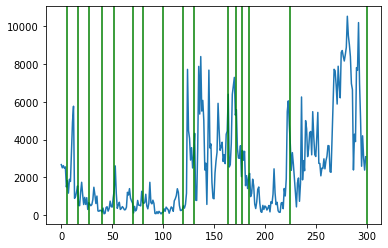

In [181]:
plt.plot(flow_data[:300])
for cut in my_cuts_number:
    plt.axvline(x=cut, color='green')

####  Ищем выбросы. Критерий Шовене https://newtechaudit.ru/ishhem-vybrosy-kriterij-shovene/

In [206]:
import math 
import statistics as st 

def shovene(data):
    df=data.iloc[:, 0].tolist()
    iteration_counter = 0
    pp=[ ] #запишем выбросы в переменную
    while True and len(df) > 1:
        iteration_counter += 1
        stop_iter = True
        p_mean = st.mean(df)
        p_stdev = st.stdev(df)
        print("Итерация:", iteration_counter)# распечатывается номер итерации
        for p in list(df):
            if p_stdev > 0 and\
                math.erfc (math.fabs (p-p_mean)/p_stdev)<1/(2*len(df)):
                print("Обнаружена аномалия:", p)# распечатывается факт аномального выброса
                pp.append(p)
                df.remove(p)
                stop_iter = False
        if stop_iter:
            break
    d_float=np.array(pp, dtype=np.float32)
    return round((len(d_float)/len(data)*100),2), d_float

In [207]:
df_flow_data = pd.DataFrame(flow_data[:300])
dd=shovene(df_flow_data)
print('Шовене - процент выбросов',dd[0])# отображение процента выбросов
print('Шовене - выбросы',dd[1])# отображаются собственно выбросы

Итерация: 1
Обнаружена аномалия: 7871.90771484375
Обнаружена аномалия: 8392.0380859375
Обнаружена аномалия: 7880.748046875
Обнаружена аномалия: 8613.3583984375
Обнаружена аномалия: 8710.697265625
Обнаружена аномалия: 8400.4609375
Обнаружена аномалия: 8156.92626953125
Обнаружена аномалия: 8486.638671875
Обнаружена аномалия: 8882.7431640625
Обнаружена аномалия: 10523.8935546875
Обнаружена аномалия: 9497.8349609375
Обнаружена аномалия: 9022.453125
Обнаружена аномалия: 8394.4736328125
Обнаружена аномалия: 7805.7109375
Обнаружена аномалия: 10188.3994140625
Итерация: 2
Обнаружена аномалия: 7714.498046875
Обнаружена аномалия: 7674.568359375
Обнаружена аномалия: 6824.90771484375
Обнаружена аномалия: 7290.41357421875
Обнаружена аномалия: 7718.62109375
Обнаружена аномалия: 7640.67041015625
Обнаружена аномалия: 6890.7197265625
Обнаружена аномалия: 6890.96044921875
Обнаружена аномалия: 6958.83154296875
Обнаружена аномалия: 6643.75439453125
Обнаружена аномалия: 7664.22119140625
Обнаружена аномалия:

In [284]:
# Узнаем индексы найденных элементов
indexes = []
for d in dd[1]:
    idx = np.where(df_flow_data[0] == d)
    indexes.append(idx[0][0])
    print(idx[0][0])

135
137
272
275
276
277
278
279
280
281
282
283
284
290
292
124
145
169
170
268
269
270
273
285
286
291
293
12
139
154
164
168
172
223
236
267
271
274
11
136
138
140
171
222
240
247
252
294
125
155
163
224
241
245
131
162
244
248
288
296
126
251
266
158
289
167
147


#### Смотрим на результат. Видим, что в начале (примерно до 130 кадра) много выбросов не определилось, хотя разделение должно присутствовать. В конце (после 220 кадра) наоборот - выделили много выбросов, но разделения на кадры не должно происходить

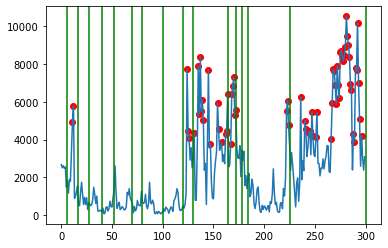

In [301]:
plt.plot(flow_data[:300])
for cut in my_cuts_number:
    plt.axvline(x=cut, color='green')

plt.scatter(x = indexes, y=dd[1], color='red')
    

#### Попробуем другой способ определения пиков.https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.find_peaks.html
Нашили все пики на графике, очевидно, что их больше необходимого, возможно есть способ отобрать необходимые. Но пока результат не подходит

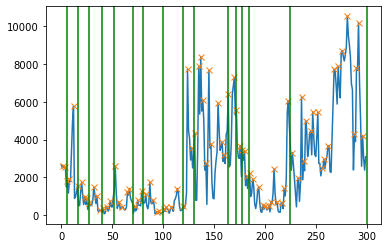

In [321]:
from scipy.signal import find_peaks
x = df_flow_data[0]
peaks, _ = find_peaks(x, height=0)
plt.plot(x)
plt.plot(peaks, x[peaks], "x")
#plt.plot(np.zeros_like(x), "--", color="gray")
for cut in my_cuts_number:
    plt.axvline(x=cut, color='green')
plt.show()

#### Motion History Image (MHI). Тоже есть много статей, использующих данный подход для распознавания действий по "слепку" движений

In [382]:
"""
Example to extract motion history images using opencv2. stripped from opencv2 python examples motempl.py
link to the gif: https://giphy.com/gifs/bJDYIRToRpkEU
command to extract the jpgs: convert example.gif -coalesce images/example-%03d.jpg
You have to use fixed length pattern for image sequence, such as ./images/example-%03d.jpg
"""

import numpy as np
import cv2

MHI_DURATION = 50
DEFAULT_THRESHOLD = 32
display_handle=display(None, display_id=True)

#df_MHI = pd.DataFrame(columns=["Frame Number", "MHI"])
def main():
    live_video = True
    video_src = 0
    if not live_video:
        video_src = "/Users/vladislav/Documents/JupyterNotebook/ObjectDetection/Maintenance Hand Segmentation/Python Segmentation/pump_dataset/pump_videos/test_pump_video.mp4"

    cam = cv2.VideoCapture(video_src)
    ret, frame = cam.read()
    h, w = frame.shape[:2]
    prev_frame = frame.copy()
    motion_history = np.zeros((h, w), np.float32)
    timestamp = 0
    try:
        while True:
#   	     data = {}
            ret, frame = cam.read()
            if not ret:
                break
            frame_diff = cv2.absdiff(frame, prev_frame)
            gray_diff = cv2.cvtColor(frame_diff, cv2.COLOR_BGR2GRAY)
            ret, fgmask = cv2.threshold(gray_diff, DEFAULT_THRESHOLD, 1, cv2.THRESH_BINARY)
            timestamp += 1
    
            # update motion history
            cv2.motempl.updateMotionHistory(fgmask, motion_history, timestamp, MHI_DURATION)
    
            # normalize motion history
            mh = np.uint8(np.clip((motion_history - (timestamp - MHI_DURATION)) / MHI_DURATION, 0, 1) * 255)
    
            prev_frame = frame.copy()
            
            frame_number = cam.get(cv2.CAP_PROP_POS_FRAMES)
#   	     data.update({"Frame Number": frame_number})
#   	     data.update({"MHI": mh})
#   	     df_MHI.loc[len(df_MHI)] = data
    
            # Display in notebook    
            _, frame = cv2.imencode('.jpeg', mh)
            display_handle.update(Image(data=frame.tobytes()))

    except KeyboardInterrupt:
        pass
    finally:
        cap.release()
        display_handle.update(None)

if __name__ == "__main__":
    main()

None

In [318]:
### + Расчеты каких-то параметров для MHI

#### Подборка статей по использованию Optical flow и Motion History image для распознавания действий на видео

https://ieeexplore.ieee.org/document/5543160
https://www.researchgate.net/profile/Somayeh-Danafar-2/publication/220745292_Action_Recognition_for_Surveillance_Applications_Using_Optic_Flow_and_SVM/links/0c960539c4bb41a285000000/Action-Recognition-for-Surveillance-Applications-Using-Optic-Flow-and-SVM.pdf
http://ieeexplore.ieee.org/document/5597145/
10.1109/TPAMI.2017.2769085
http://ieeexplore.ieee.org/document/4481222/ (Literature review)
10.3390/s150100932 (Literature review)
http://arxiv.org/abs/1612.06615
http://ieeexplore.ieee.org/document/6619215/
http://ieeexplore.ieee.org/document/1023803/
https://www.cs.toronto.edu/~fleet/research/Papers/flowChapter05.pdf
https://arxiv.org/abs/1601.07532
http://arxiv.org/abs/2104.00680
https://onlinelibrary.wiley.com/doi/abs/10.1049/iet-cvi.2018.5556
http://ieeexplore.ieee.org/document/1398371/
http://link.springer.com/10.1007/978-1-84800-304-0_7
https://link.springer.com/chapter/10.1007/978-1-4471-4730-5_3
http://ieeexplore.ieee.org/document/7351170/
https://www.mdpi.com/2079-9292/11/18/2959
http://ieeexplore.ieee.org/document/212720/ (Посмореть графики)
http://arxiv.org/abs/1712.08416
https://doi.org/10.1007/s11760-014-0677-9
http://arxiv.org/abs/1701.03246
https://www.researchgate.net/profile/Jagadeesh-Basavaiah/publication/312326378_Video_based_action_detection_and_recognition_human_using_optical_flow_and_SVM_classifier/links/6082672e2fb9097c0c01f2d9/Video-based-action-detection-and-recognition-human-using-optical-flow-and-SVM-classifier.pdf







Deep Learning. Именно по теме нейронных сетей и Deep Learning очень много примеров, но все модели очень большие, емкие и сложные. Для примера добавил несколько:
https://www.techrxiv.org/articles/preprint/Deep_Learning_for_Video_Classification_A_Review/15172920/1
https://ieeexplore.ieee.org/document/8302061
https://ieeexplore.ieee.org/document/9879633/


#### Ниже представлен вариант алгоритма для определения изменения действий на видео. Для этого необходимо обучить модель распознавать объекты в руках (Есть в руках что-то/пустая рука). Обучил Yolov5 на датасете из 300 картинок, но качество обучения оказалось низким и поэтому дальнейший алгоритм не удалось проверить

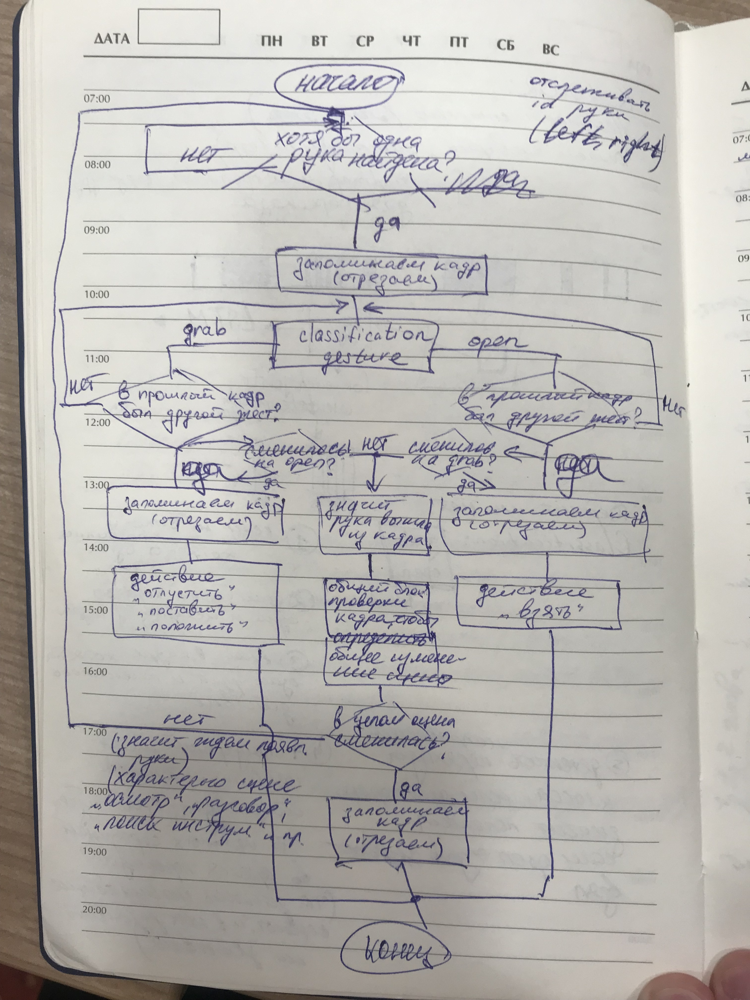

In [311]:
Image(filename = "/Users/vladislav/Downloads/IMG_2795.jpg", width=600)

#### Еще есть интересная, но сложная тема под названием Hand Object Interactions. В ней рассматривают, как руки взаимодействуют с различными объектами. Есть небольшая подборка статей на эту тему. Также, возможно, стоит обратиться внимание на то, что следует рассматривать взаимодействие с объектами только от первого лица, тк камера будет на каске/шлеме
Примеры статей на эту тему:
http://arxiv.org/abs/2104.11181
http://arxiv.org/abs/1907.01481
https://ieeexplore.ieee.org/document/9710775/
http://arxiv.org/abs/2006.06669
https://openaccess.thecvf.com/content_ICCV_2017/papers/Mueller_Real-Time_Hand_Tracking_ICCV_2017_paper.pdf
http://arxiv.org/abs/1904.05767
http://arxiv.org/abs/2201.04906
https://ieeexplore.ieee.org/document/9197299/
http://arxiv.org/abs/2104.11181 (Вот это очень похожа на то, что нужно)
http://arxiv.org/abs/2008.11200
https://ieeexplore.ieee.org/document/7780656 (Вот это очень похожа на то, что нужно)
https://dl.acm.org/doi/10.1145/3130800.3130883
http://arxiv.org/abs/2007.09545 (Эта тоже интересная, но, наверное, не совсем то, что нам нужно. Определяют места контактков с объектом на руках)
http://arxiv.org/abs/1711.05523
http://arxiv.org/abs/1704.02463

In [28]:
import cv2


video = cv2.VideoCapture("/Users/vladislav/Documents/JupyterNotebook/ObjectDetection/Maintenance Hand Segmentation/Python Segmentation/pump_dataset/pump_videos/test_pump_video.mp4")
display_handle=display(None, display_id=True)
try:
    while True:
        _, frame = video.read()
        #frame = cv2.flip(frame, 1) # if your camera reverses your image
        _, frame = cv2.imencode('.jpeg', frame)
        display_handle.update(Image(data=frame.tobytes()))
except KeyboardInterrupt:
    pass
finally:
    video.release()
    display_handle.update(None)

None

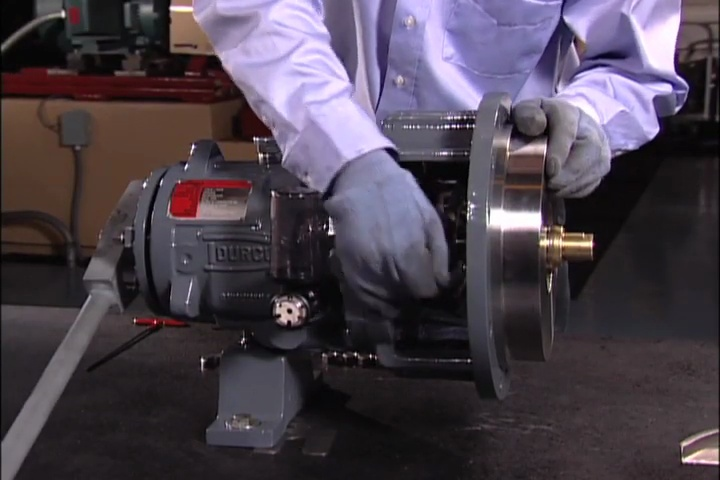

In [24]:
Image(filename = "/Users/vladislav/Documents/JupyterNotebook/ObjectDetection/Maintenance Hand Segmentation/Python Segmentation/pump_dataset/video_frames/FlowServe Assembly/584.jpg")

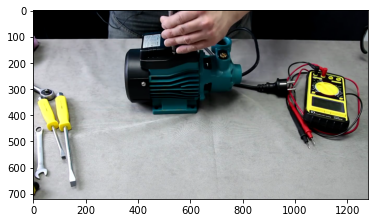

In [44]:
import cv2
import time 
from matplotlib import pyplot as plt

vcap = cv2.VideoCapture("/Users/vladislav/Documents/JupyterNotebook/ObjectDetection/Maintenance Hand Segmentation/Python Segmentation/pump_dataset/pump_videos/test_pump_video.mp4")
if not vcap.isOpened():
    print("File Cannot be Opened")
i += 1
# Capture frame-by-frame
ret, frame = vcap.read()
#print cap.isOpened(), ret
if frame is not None:
    # Display the resulting frame
    #cv2.imshow('frame',frame)
    img2 = frame[:,:,::-1]
    plt.imshow(img2)
    

        